In [37]:
# Libraries
import pandas as pd, seaborn as sns, pingouin as pg, matplotlib.pyplot as plt, plotly.express as px, numpy as np, re, ipywidgets as widgets
from sklearn.preprocessing import OneHotEncoder

# Credit Risk Analysis - Exloratory analysis<br>

The objective of this analysis is to understand which are the factors that are effecting the probability of default of a given company, using initially only the data of the explanatory variables of 2019 to predict the ratings of 2020 (so as to compare the forecasts with the true values of the rating). <br>
Then it can be added new explanatory variables 'delayed' eg leverage to 2018, 2017, etc. <br>
In this specific notebook the modified dataset will be imported and some exploratory analysis will be applied.

**Financial Data Science (UniPV) - Prof. Paolo Giudici** <br>
*Computer Engineering (Data Science) - A.Y. 2022/23* <br>
*Francesco Amato, 507767*

### Import the dataset

In [2]:
# Load the datatset
companies_df = pd.read_csv('../dataset/cleaned-credit-risk.tar.gz', compression='gzip')
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,ROE.2018,ROE.2017,ROE.2016,ROE.2015,TAsset.2020,TAsset.2019,TAsset.2018,TAsset.2017,TAsset.2016,TAsset.2015
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,8.24,-146.65,60.76,-471.72,49263,28268,15455,15992,13597.0,11659.0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,61.42,-55.57,-127.29,-87.13,16550,16887,16468,10773,6697.0,8933.0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,57.52,42.73,20.34,44.62,13500,9620,7371,5432,4170.0,2862.0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,-17.24,0.71,2.89,6.45,24978,25032,25729,21632,25403.0,24941.0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,-5.17,-6.74,0.03,-8.19,36823,34659,36205,38423,41847.0,41323.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,11.01,8.44,7.83,6.31,15935,15664,14438,13054,12243.0,11695.0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,0.62,-4.80,-7.85,-12.84,2487,2317,2351,2521,2797.0,3152.0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,1.88,3.10,2.90,5.62,2547,1855,1692,1843,1773.0,1699.0
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,3.74,3.54,18.85,0.58,2961,2552,2604,2474,1546.0,1222.0


### Visualize companies by coordinates
#### Add to each row (representing a different company) the coordinate of the city

The objective is to obtain a graph that displays where the companies are located.<br>
Please **note** that since we do not have the precise address of the company we can just show an approximate location (a gaussian noise has been added to avoid that multiple companies overlap in the same exact geographical location).

In [3]:
countries_df = pd.read_csv('../dataset/countries.tar.gz', compression='gzip')[['name', 'alpha-2']]
cities_df = pd.read_csv('../dataset/world-cities.tar.gz', low_memory=False, compression='gzip')[['City', 'Country', 'Latitude', 'Longitude']]

In [4]:
countries_df['alpha-2'] = countries_df['alpha-2'].str.lower()
countries_df = countries_df.rename(columns={'name':'Country'})
countries_df

,Country,alpha-2
0,Afghanistan,af
1,Åland Islands,ax
2,Albania,al
3,Algeria,dz
4,American Samoa,as
...,...,...
244,Wallis and Futuna,wf
245,Western Sahara,eh
246,Yemen,ye
247,Zambia,zm


In [5]:
cities_df['City'] = cities_df['City'].str.capitalize()
cities_df = cities_df.rename(columns={'Country':'alpha-2'})
cities_df

,City,alpha-2,Latitude,Longitude
0,Aixas,ad,42.483333,1.466667
1,Aixirivali,ad,42.466667,1.500000
2,Aixirivall,ad,42.466667,1.500000
3,Aixirvall,ad,42.466667,1.500000
4,Aixovall,ad,42.466667,1.483333
...,...,...,...,...
3173953,Zimre park,zw,-17.866111,31.213611
3173954,Ziyakamanas,zw,-18.216667,27.950000
3173955,Zizalisari,zw,-17.758889,31.010556
3173956,Zuzumba,zw,-20.033333,27.933333


In [6]:
companies_locations_df = companies_df[['Company name', 'Region', 'Country']].merge(countries_df, on='Country')
companies_locations_df = companies_locations_df.rename(columns={'Region':'City'})
companies_locations_df = companies_locations_df .merge(cities_df, on=['City', 'alpha-2'])

In [7]:
# Add gaussian noise to locs (! location is 100% precise, but this is not our purpose !)
companies_locations_df['Latitude'] += np.random.normal(0, 0.04, len(companies_locations_df))
companies_locations_df['Longitude'] += np.random.normal(0, 0.04, len(companies_locations_df))

In [8]:
fig = px.density_mapbox(companies_locations_df, lat='Latitude', lon='Longitude', radius=1.2, center=dict(lat=46.2, lon=8.2), zoom=3, mapbox_style='open-street-map', hover_name='Company name')
fig.show()

#### Details of companies for each country

Percentage of company for each country

In [9]:
round(companies_df.groupby('Country').size().sort_values(ascending=False) / len(companies_df) * 100, 1)

Country
Italy      49.5
France     27.9
Spain      21.4
Germany     1.2
dtype: float64

Number of companies for each country, for each level of MScore (select the year through the slider)

In [38]:
year_widget = widgets.IntSlider(value=2020, min=2015, max=2020, description='Year:', disabled=False, continuous_update=True, orientation='horizontal', readout=True, readout_format='d')
year_widget

IntSlider(value=2020, description='Year:', max=2020, min=2015)

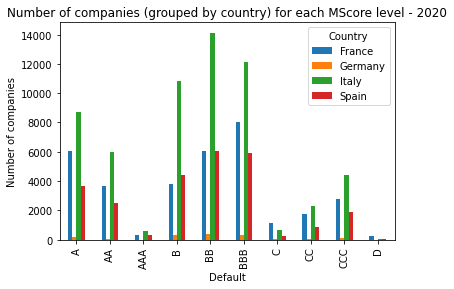

In [44]:
companies_df.groupby(['MScore.'+str(year_widget.value), 'Country']).size().unstack().plot.bar()
plt.title('Number of companies (grouped by country) for each MScore level - ' +str(year_widget.value))
plt.xlabel('Default')
plt.ylabel('Number of companies');

Casting MScore of the different years into integer values

In [11]:
# Function that takes a MScore and cast it into an integer value
def MScore_to_int(x):
    return 0 if (x[0].lower() == ('a' or 'b')) else 1

for col in [c for c in companies_df.columns if c.startswith('MScore.')]:
    companies_df[str(col)+'.int'] = companies_df[str(col)].apply(lambda x: MScore_to_int(x))

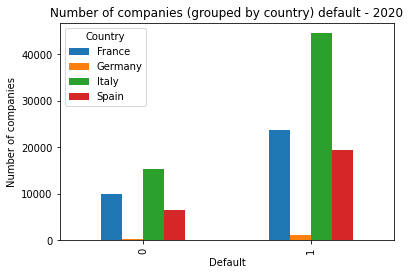

In [46]:
companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Country']).size().unstack().plot.bar()
plt.title('Number of companies (grouped by country) default - ' + str(year_widget.value))
plt.xlabel('Default')
plt.ylabel('Number of companies');

### One-hot encoding of countries

In [13]:
encoder = OneHotEncoder()
encoder.fit(companies_df[['Country']])
encoder_df = pd.DataFrame(encoder.fit_transform(companies_df[['Country']]).toarray())
encoder_df.columns = [i[3:] for i in encoder.get_feature_names().tolist()]
companies_df = companies_df.join(encoder_df.iloc[:, -4:].apply(pd.to_numeric, downcast='integer'))
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,MScore.2020.int,MScore.2019.int,MScore.2018.int,MScore.2017.int,MScore.2016.int,MScore.2015.int,France,Germany,Italy,Spain
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,1,1,1,1,1,1,0,0,1,0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,0,1,1,1,1,1,0,0,1,0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,1,1,1,1,1,1,0,0,1,0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,1,1,1,1,1,1,1,0,0,0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,1,1,1,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,0,0,0,0,0,0,0,0,1,0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,1,1,1,1,1,1,0,0,1,0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,0,0,0,1,1,0,0,0,0,1
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,1,1,1,1,1,1,0,0,1,0


### Defaults for NACE groups

In [50]:
# Continue from here!

### Correlations and partial correlations

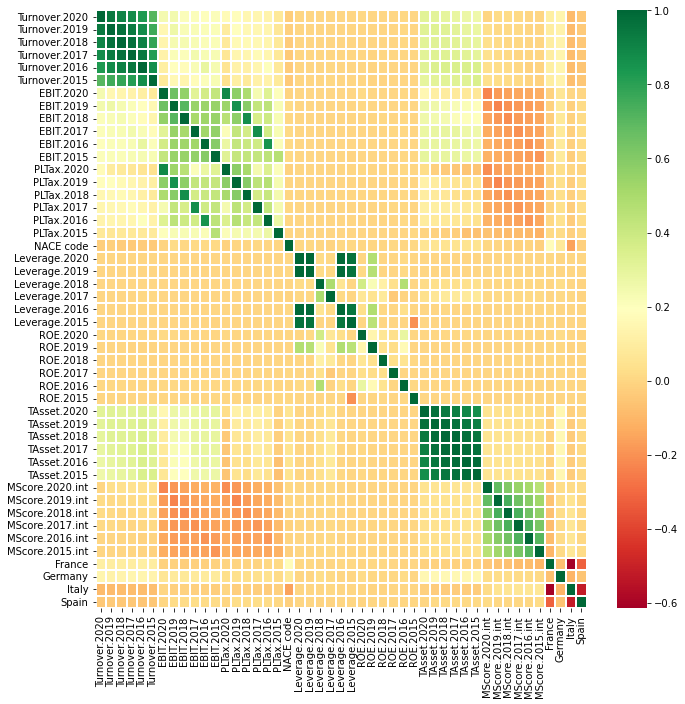

In [14]:
# Pearson correlation
plt.figure(figsize=(11, 11))
sns.heatmap(companies_df.corr(), cmap='RdYlGn', linewidths = 0.1);

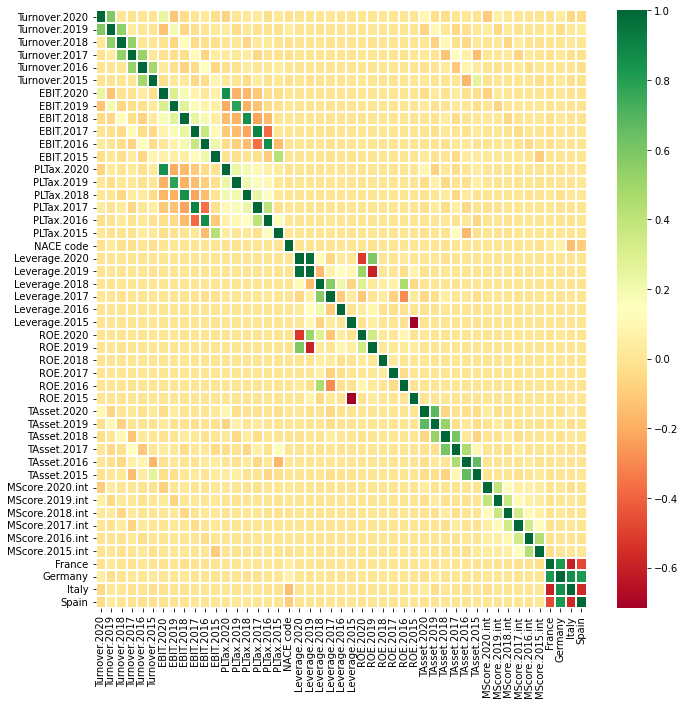

In [15]:
# Partial correlations
plt.figure(figsize=(11, 11))
sns.heatmap(pg.pcorr(companies_df), cmap='RdYlGn', linewidths = 0.1);